# Assignment 2

In this assignment, you will be asked to perform image classification using ResNet-50.

In [9]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [10]:
%cd gdrive/My\ Drive/Colab\ Notebooks/hw2/

/content/gdrive/My Drive/Colab Notebooks/hw2


First, you need to download the training and validation sets from https://github.com/yuankaihuo/DL_course_hw/tree/master/Homework%202/data. 

Save it at the working directory

In [11]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [12]:
import torch
from collections import Counter
import plotly.express as px
from sklearn.model_selection import train_test_split
import os
from glob import glob
from torchvision import transforms
from torchvision import datasets
from torch.utils.data import DataLoader, sampler
from torchvision import models
import torch.nn as nn
from torch.nn.functional import interpolate
from torch import optim, cuda, Tensor
import tqdm

# Data science tools
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None
import os

# Image manipulations
from PIL import Image
from timeit import default_timer as timer

# Visualizations
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 14

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

## Data preparation

In [13]:


# define paths and parameters
traindir = f"data/train"
validdir = f"data/val"


# Change to fit hardware
batch_size = 256


In [14]:
train_on_gpu = cuda.is_available()
print(f'Train on gpu: {train_on_gpu}')

# Number of gpus
if train_on_gpu:
    gpu_count = cuda.device_count()
    print(f'{gpu_count} gpus detected.')
    if gpu_count > 1:
        multi_gpu = True
    else:
        multi_gpu = False
else:
    multi_gpu = False
print(train_on_gpu,multi_gpu)


Train on gpu: True
1 gpus detected.
True False


In [15]:
# define transforms
# Image transformations
image_transforms = {
    # Train uses data augmentation
    'train':
        transforms.Compose([
            transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
            transforms.RandomRotation(degrees=15),
            transforms.ColorJitter(),
            transforms.RandomHorizontalFlip(),
            transforms.CenterCrop(size=224),  # Image net standards
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])  # Imagenet standards
        ]),
    # Validation does not use augmentation
    'valid':
        transforms.Compose([
            transforms.Resize(size=256),
            transforms.CenterCrop(size=224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
}


<Figure size 1728x1728 with 0 Axes>

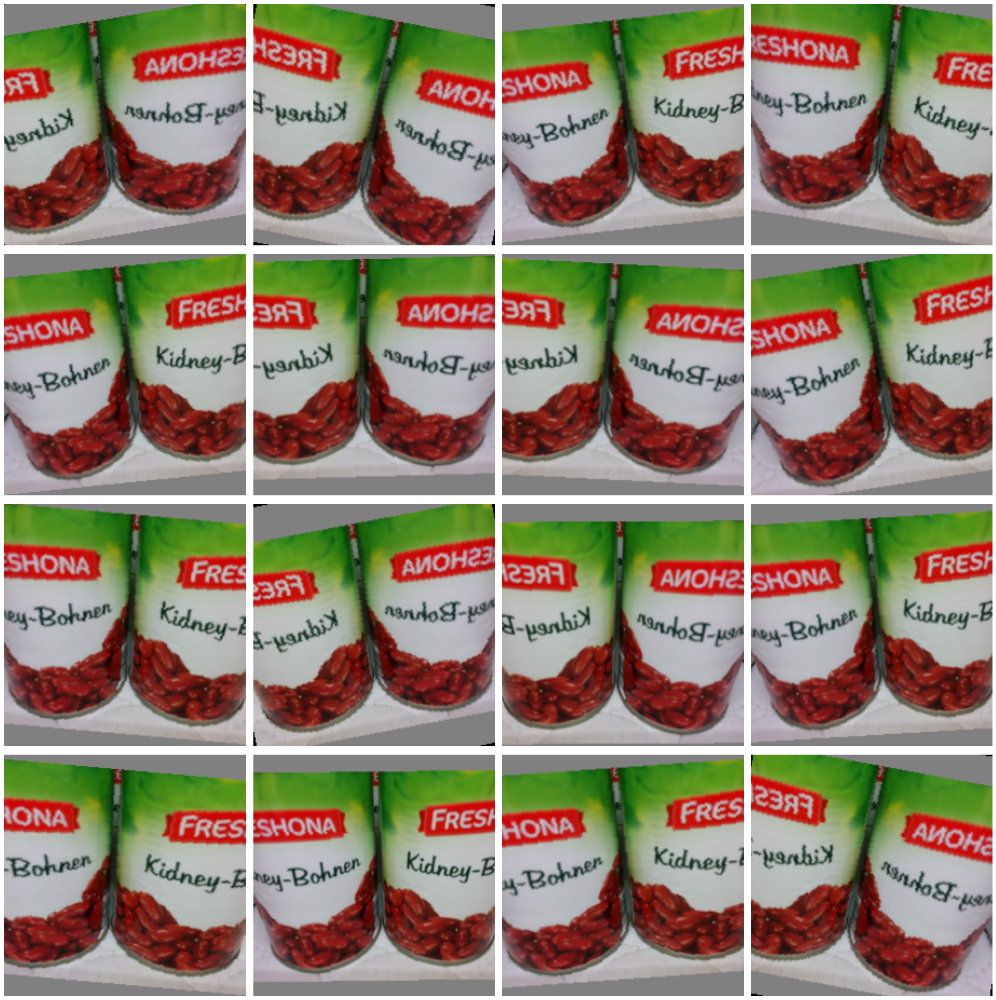

In [16]:
# take a look at data augmentation

def imshow_tensor(image, ax=None, title=None):
    """Imshow for Tensor."""

    if ax is None:
        fig, ax = plt.subplots()

    # Set the color channel as the third dimension
    image = image.numpy().transpose((1, 2, 0))

    # Reverse the preprocessing steps
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean

    # Clip the image pixel values
    image = np.clip(image, 0, 1)

    ax.imshow(image)
    plt.axis('off')

    return ax, image

    
ex_img = Image.open('data/train/BEANS/BEANS0001.png')

t = image_transforms['train']
plt.figure(figsize=(24, 24))

for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    _ = imshow_tensor(t(ex_img), ax=ax)

plt.tight_layout()
plt.show()


In [17]:
# Datasets from folders
data = {
    'train':
    datasets.ImageFolder(root=traindir, transform=image_transforms['train']),
    'valid':
    datasets.ImageFolder(root=validdir, transform=image_transforms['valid'])
}

# Dataloader iterators, make sure to shuffle
dataloaders = {
    'train': DataLoader(data['train'], batch_size=batch_size, shuffle=True,num_workers=10),
    'val': DataLoader(data['valid'], batch_size=batch_size, shuffle=True,num_workers=10)
}

dataloaders_noshuffle = {
    'train': DataLoader(data['train'], batch_size=batch_size, shuffle=True,num_workers=10),
    'val': DataLoader(data['valid'], batch_size=batch_size, shuffle=False,num_workers=10)
}

# Iterate through the dataloader once
trainiter = iter(dataloaders['train'])
features, labels = next(trainiter)
features.shape, labels.shape

categories = []
for d in os.listdir(traindir):
    categories.append(d)

n_classes = len(categories)
print(f'There are {n_classes} different classes.')

(torch.Size([256, 3, 224, 224]), torch.Size([256]))

There are 25 different classes.


## Training process

In [9]:
def train(model,
          criterion,
          optimizer,
          train_loader,
          valid_loader,
          save_file_name,
          max_epochs_stop=3,
          n_epochs=20,
          print_every=1,
          prefix=None):
    """Train a PyTorch Model

    Params
    --------
        model (PyTorch model): cnn to train
        criterion (PyTorch loss): objective to minimize
        optimizer (PyTorch optimizier): optimizer to compute gradients of model parameters
        train_loader (PyTorch dataloader): training dataloader to iterate through
        valid_loader (PyTorch dataloader): validation dataloader used for early stopping
        save_file_name (str ending in '.pt'): file path to save the model state dict
        max_epochs_stop (int): maximum number of epochs with no improvement in validation loss for early stopping
        n_epochs (int): maximum number of training epochs
        print_every (int): frequency of epochs to print training stats

    Returns
    --------
        model (PyTorch model): trained cnn with best weights
        history (DataFrame): history of train and validation loss and accuracy
    """

    # Early stopping intialization
    epochs_no_improve = 0
    valid_loss_min = np.Inf

    valid_max_acc = 0
    history = []

    # Number of epochs already trained (if using loaded in model weights)
    try:
        print(f'Model has been trained for: {model.epochs} epochs.\n')
    except:
        model.epochs = 0
        print(f'Starting Training from Scratch.\n')

    overall_start = timer()

    # Main loop
    for epoch in range(n_epochs):

        # keep track of training and validation loss each epoch
        train_loss = 0.0
        valid_loss = 0.0

        train_acc = 0
        valid_acc = 0

        # Set to training
        model.train()
        start = timer()

        # Training loop
        for ii, (data, target) in enumerate(train_loader):
            # Tensors to gpu
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()

            # Clear gradients
            optimizer.zero_grad()
            # Predicted outputs are log probabilities
            output = model(data)

            

            # Loss and backpropagation of gradients
            

       
            if '_mse' in prefix:
              loss = criterion(output, nn.functional.one_hot(target,num_classes=25).type(torch.FloatTensor).cuda())
            else:
              loss = criterion(output, target)

            # loss = criterion(output, target)
            loss.backward()
         

            # Update the parameters
            optimizer.step()

            # Track train loss by multiplying average loss by number of examples in batch
            train_loss += loss.item() * data.size(0)

            # Calculate accuracy by finding max log probability

            _, pred = torch.max(output, dim=1)
            correct_tensor = pred.eq(target.data.view_as(pred))
            # Need to convert correct tensor from int to float to average
            accuracy = torch.mean(correct_tensor.type(torch.FloatTensor))
            # Multiply average accuracy times the number of examples in batch
            train_acc += accuracy.item() * data.size(0)

            # Track training progress
            print(
                f'Epoch: {epoch}\t{100 * (ii + 1) / len(train_loader):.2f}% complete. {timer() - start:.2f} seconds elapsed in epoch.',
                end='\r')

        # After training loops ends, start validation
        else:
            model.epochs += 1

            # Don't need to keep track of gradients
            with torch.no_grad():
                # Set to evaluation mode
                model.eval()

                # Validation loop
                for data, target in valid_loader:
                    # Tensors to gpu
                    if train_on_gpu:
                        data, target = data.cuda(), target.cuda()

                    # Forward pass
                    output = model(data)

                    # Validation loss
                    
                    if '_mse' in prefix:
                      loss = criterion(output, nn.functional.one_hot(target,num_classes=25).type(torch.FloatTensor).cuda())
                    else:
                      loss = criterion(output, target)
                    # loss = criterion(output, target)
                    # Multiply average loss times the number of examples in batch
                    valid_loss += loss.item() * data.size(0)

                    # Calculate validation accuracy
                    _, pred = torch.max(output, dim=1)
                    correct_tensor = pred.eq(target.data.view_as(pred))
                    accuracy = torch.mean(
                        correct_tensor.type(torch.FloatTensor))
                    # Multiply average accuracy times the number of examples
                    valid_acc += accuracy.item() * data.size(0)

                # Calculate average losses
                train_loss = train_loss / len(train_loader.dataset)
                valid_loss = valid_loss / len(valid_loader.dataset)

                # Calculate average accuracy
                train_acc = train_acc / len(train_loader.dataset)
                valid_acc = valid_acc / len(valid_loader.dataset)

                history.append([train_loss, valid_loss, train_acc, valid_acc])

                # Print training and validation results
                if (epoch + 1) % print_every == 0:
                    print(
                        f'\nEpoch: {epoch} \tTraining Loss: {train_loss:.4f} \tValidation Loss: {valid_loss:.4f}'
                    )
                    print(
                        f'\t\tTraining Accuracy: {100 * train_acc:.2f}%\t Validation Accuracy: {100 * valid_acc:.2f}%'
                    )

                # Save the model if validation loss decreases
                if valid_loss < valid_loss_min:
                    # Save model
                    torch.save(model.state_dict(), save_file_name)
                    # Track improvement
                    epochs_no_improve = 0
                    valid_loss_min = valid_loss
                    valid_best_acc = valid_acc
                    best_epoch = epoch

                # Otherwise increment count of epochs with no improvement
                else:
                    epochs_no_improve += 1
                    # Trigger early stopping
                    if epochs_no_improve >= max_epochs_stop:
                        print(
                            f'\nEarly Stopping! Total epochs: {epoch}. Best epoch: {best_epoch} with loss: {valid_loss_min:.2f} and acc: {100 * valid_best_acc:.2f}%'
                        )
                        total_time = timer() - overall_start
                        print(
                            f'{total_time:.2f} total seconds elapsed. {total_time / (epoch+1):.2f} seconds per epoch.'
                        )

                        # Load the best state dict
                        model.load_state_dict(torch.load(save_file_name))
                        # Attach the optimizer
                        model.optimizer = optimizer

                        # Format history
                        history = pd.DataFrame(
                            history,
                            columns=[
                                'train_loss', 'valid_loss', 'train_acc',
                                'valid_acc'
                            ])
                        return model, history

    # Attach the optimizer
    model.optimizer = optimizer
    # Record overall time and print out stats
    total_time = timer() - overall_start
    print(
        f'\nBest epoch: {best_epoch} with loss: {valid_loss_min:.2f} and acc: {100 * valid_best_acc:.2f}%'
    )
    print(
        f'{total_time:.2f} total seconds elapsed. {total_time / (epoch+1):.2f} seconds per epoch.'
    )
    # Format history
    history = pd.DataFrame(
        history,
        columns=['train_loss', 'valid_loss', 'train_acc', 'valid_acc'])
    return model, history

## ResNet modeling

In [183]:
prefix='resnet50_mse'
save_file_name = f'%s-transfer.pt'%prefix
checkpoint_path = f'%s-transfer.pth'%prefix

# model = models.resnet152(pretrained=True)
# model = models.resnet18(pretrained=True)
model = models.resnet50(pretrained=True)
# model = models.ghostnet(pretrained=True)
# model = torch.hub.load('huawei-noah/ghostnet', 'ghostnet_1x', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.6.0', 'inception_v3', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.6.0', 'densenet161', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.6.0', 'vgg19_bn', pretrained=True)
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x16d_wsl')
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x8d_wsl')
# model = torch.hub.load('PingoLH/Pytorch-HarDNet', 'hardnet85', pretrained=True)

# Freeze model weights
for param in model.parameters():
    param.requires_grad = False

# for densenet and so on
# n_inputs = model.classifier.in_features
# model.classifier = nn.Sequential(
#                       nn.Linear(n_inputs, 256),
#                       nn.ReLU(),
#                       nn.Dropout(0.4),
#                       nn.Linear(256, n_classes),
#                       nn.LogSoftmax(dim=1))
# model.classifier

# for mse
n_inputs = model.fc.in_features
model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.Softmax(dim=1))

#for resnet
# n_inputs = model.fc.in_features
# model.fc = nn.Sequential(
#                       nn.Linear(n_inputs, 256),
#                       nn.ReLU(),
#                       nn.Dropout(0.4),
#                       nn.Linear(256, n_classes),
#                       nn.LogSoftmax(dim=1))

# model.fc

total_params = sum(p.numel() for p in model.parameters())
print(f'{total_params:,} total parameters.')
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f'{total_trainable_params:,} training parameters.')


if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

list(model.idx_to_class.items())[:10]

# criterion = nn.NLLLoss()
criterion = nn.MSELoss()
# def mynn(self, output,target):
#     def mseloss():
#         return self.checkAnswer(question, answer)

#     return checker
# def my_mse(output=1,target=1):
#   target=nn.functional.one_hot(target,num_classes=25).type(torch.FloatTensor).cuda()
#   return(nn.MSELoss(output,target))
# criterion =my_mse()

optimizer = optim.Adam(model.parameters())

for p in optimizer.param_groups[0]['params']:
    if p.requires_grad:
        print(p.shape)

# model.load_state_dict(torch.load('best_model_%s.pt'%prefix))

24,039,001 total parameters.
530,969 training parameters.


[(0, 'BEANS'),
 (1, 'CAKE'),
 (2, 'CANDY'),
 (3, 'CEREAL'),
 (4, 'CHIPS'),
 (5, 'CHOCOLATE'),
 (6, 'COFFEE'),
 (7, 'CORN'),
 (8, 'FISH'),
 (9, 'FLOUR')]

torch.Size([256, 2048])
torch.Size([256])
torch.Size([25, 256])
torch.Size([25])


## Run this on GPU

In [184]:
model, history = train(model,
    criterion,
    optimizer,
    dataloaders['train'],
    dataloaders['val'],
    save_file_name=save_file_name,
    max_epochs_stop=3,
    n_epochs=10,
    print_every=1,
    prefix=prefix)



Starting Training from Scratch.


Epoch: 0 	Training Loss: 0.0376 	Validation Loss: 0.0350
		Training Accuracy: 13.39%	 Validation Accuracy: 27.88%

Epoch: 1 	Training Loss: 0.0342 	Validation Loss: 0.0320
		Training Accuracy: 28.51%	 Validation Accuracy: 35.35%

Epoch: 2 	Training Loss: 0.0316 	Validation Loss: 0.0296
		Training Accuracy: 36.67%	 Validation Accuracy: 38.69%

Epoch: 3 	Training Loss: 0.0292 	Validation Loss: 0.0275
		Training Accuracy: 42.78%	 Validation Accuracy: 45.66%

Epoch: 4 	Training Loss: 0.0273 	Validation Loss: 0.0257
		Training Accuracy: 47.31%	 Validation Accuracy: 51.21%

Epoch: 5 	Training Loss: 0.0260 	Validation Loss: 0.0242
		Training Accuracy: 50.14%	 Validation Accuracy: 55.76%

Epoch: 6 	Training Loss: 0.0246 	Validation Loss: 0.0232
		Training Accuracy: 53.68%	 Validation Accuracy: 55.96%

Epoch: 7 	Training Loss: 0.0233 	Validation Loss: 0.0232
		Training Accuracy: 56.86%	 Validation Accuracy: 55.66%

Epoch: 8 	Training Loss: 0.0226 	Validation Lo

## Save results

In [180]:

print('best_model_%s.pt'%prefix)
torch.save(model.state_dict(), 'best_model_%s.pt'%prefix)

model.load_state_dict(torch.load('best_model_%s.pt'%prefix))

history.to_csv("history_%s.csv"%prefix,index=False)


best_model_resnet50.pt


<All keys matched successfully>

## Visualize results

Validation function

In [27]:
def validate_saved_model(model,prefix,valid_loader = dataloaders['val'],criterion=nn.NLLLoss()):
  if '_mse' in prefix:
    # print('mse')
    criterion=nn.MSELoss()
  #loss curve
  history =pd.read_csv("history_%s.csv"%prefix)
  # print('traning, validation loss and accuracy curve for resnet18')

  plt.figure(figsize=(8, 6))
  for c in ['train_loss', 'valid_loss']:
      plt.plot(
          history[c], label=c)
  plt.legend()
  plt.xlabel('Epoch')
  plt.ylabel('Average Negative Log Likelihood')
  plt.title('Training and Validation Losses')
  plt.show()
  #accuracy curve
  plt.figure(figsize=(8, 6))
  for c in ['train_acc', 'valid_acc']:
      plt.plot(
          100 * history[c], label=c)
  plt.legend()
  plt.xlabel('Epoch')
  plt.ylabel('Average Accuracy')
  plt.title('Training and Validation Accuracy')
  plt.show()

  #validate
  valid_loss = 0.0
  valid_acc = 0.0
  pred_array=np.array([])
  target_array=np.array([])
  with torch.no_grad():
    # Set to evaluation mode
    # model.eval()

    # Validation loop
    i=0
    for input_data, target in valid_loader:
      
        # Tensors to gpu
        if train_on_gpu:
            input_data, target = input_data.cuda(), target.cuda()

        # Forward pass

        output = model(input_data)
        if '_mse' in prefix:
          # print('mse')
          loss = criterion(output, nn.functional.one_hot(target,num_classes=25).type(torch.FloatTensor).cuda())
          # valid_loss += loss.item() 
        else:
          loss = criterion(output, target)
        valid_loss += loss.item() * input_data.size(0)

        # Calculate validation accuracy
        _, pred = torch.max(output, dim=1)
        
        
        correct_tensor = pred.eq(target.data.view_as(pred))

        accuracy = torch.mean(
            correct_tensor.type(torch.FloatTensor))
        # Multiply average accuracy times the number of examples
        valid_acc += accuracy.item() * input_data.size(0)


        #save result
        pred=pred.cpu().numpy()
        target=target.cpu().numpy()
        pred_array=np.concatenate((pred_array,pred))
        target_array=np.concatenate((target_array,target))

  valid_loss = valid_loss / len(valid_loader.dataset)
  valid_acc = valid_acc / len(valid_loader.dataset)
  print('overall loss:',valid_loss)
  print('overall accuracy:',valid_acc)
  print('report: \n')
  from sklearn.metrics import classification_report
  y_true = target_array
  y_pred = pred_array
  target_names = list(data['train'].class_to_idx.keys())
  print(classification_report(y_true, y_pred, target_names=target_names))
  #missclassified data
  mis_img=input_data[correct_tensor==False][:10].cpu()
  correct_tensor=correct_tensor.cpu()
  mis_pred=pred[correct_tensor==False][:10]
  mis_target=target[correct_tensor==False][:10]
  print('10 misclassified images:\n')
  plt.figure(figsize=(25, 10))
  for i in range(10):
      ax = plt.subplot(2, 5, i + 1)
      _ = imshow_tensor(mis_img[i], ax=ax)
      ax.title.set_text('Prediction: %s \n Target: %s'%(target_names[mis_pred[i]],target_names[mis_target[i]]))

  plt.tight_layout()
  plt.show()
  return()

## 1 Resnet50

loss: 1.33

accuracy: 61%

<All keys matched successfully>

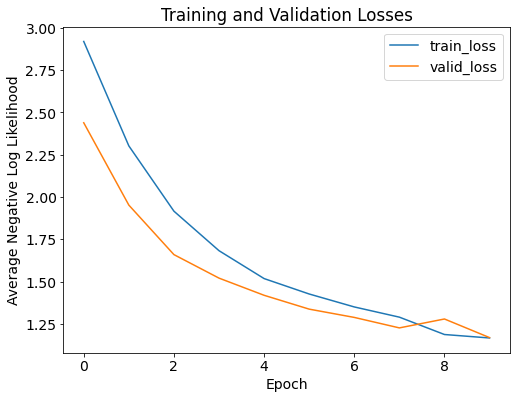

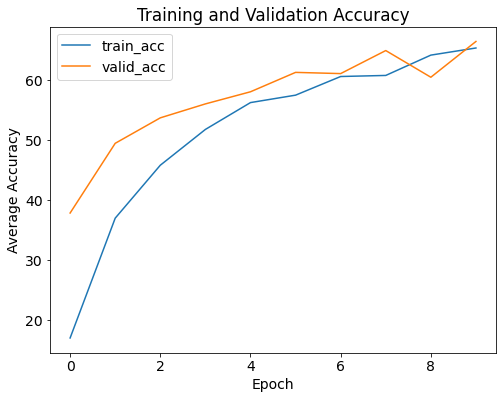

overall loss: 1.3332968682953805
overall accuracy: 0.6111111070170547
report: 

              precision    recall  f1-score   support

       BEANS       0.59      0.70      0.64        27
        CAKE       0.53      0.62      0.57        32
       CANDY       0.62      0.71      0.66        75
      CEREAL       0.64      0.62      0.63        56
       CHIPS       0.56      0.61      0.59        36
   CHOCOLATE       0.61      0.55      0.58        62
      COFFEE       0.61      0.73      0.67        60
        CORN       0.75      0.79      0.77        19
        FISH       0.78      0.64      0.70        22
       FLOUR       0.50      0.36      0.42        22
       HONEY       0.60      0.78      0.68        37
         JAM       0.78      0.73      0.75        48
       JUICE       0.50      0.70      0.59        61
        MILK       0.63      0.69      0.66        32
        NUTS       0.52      0.35      0.42        34
         OIL       0.48      0.38      0.42        29
 

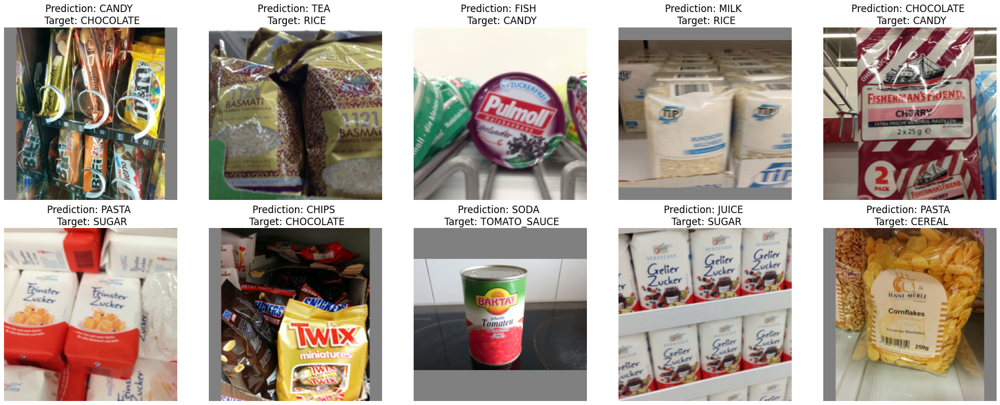

()

In [182]:
prefix='resnet50'
model = models.resnet50(pretrained=True)
n_inputs = model.fc.in_features
model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.LogSoftmax(dim=1))

if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

model.load_state_dict(torch.load('best_model_%s.pt'%prefix))
validate_saved_model(model=model,prefix=prefix)

## 2 Resnet18


Resnet18 has worse performance than Resnet50. This is because Resnet18 has less layers than Resnet50, so that the final extracted features might be not good enough to do classification.

<All keys matched successfully>

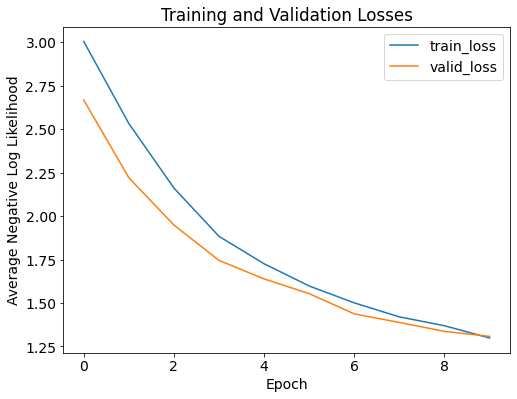

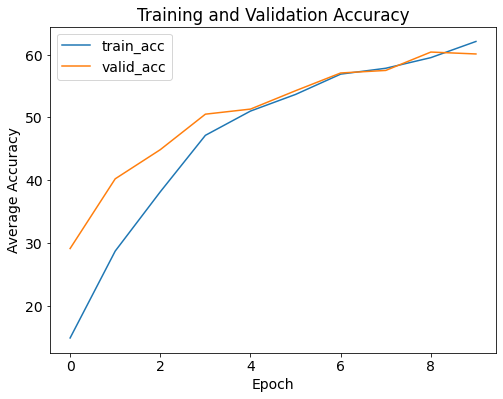

overall loss: 1.4510697222719289
overall accuracy: 0.5737373677167026
report: 

              precision    recall  f1-score   support

       BEANS       0.58      0.52      0.55        27
        CAKE       0.65      0.62      0.63        32
       CANDY       0.58      0.64      0.61        75
      CEREAL       0.48      0.54      0.51        56
       CHIPS       0.55      0.58      0.57        36
   CHOCOLATE       0.53      0.65      0.58        62
      COFFEE       0.57      0.78      0.66        60
        CORN       0.67      0.63      0.65        19
        FISH       0.68      0.59      0.63        22
       FLOUR       0.55      0.27      0.36        22
       HONEY       0.68      0.68      0.68        37
         JAM       0.57      0.81      0.67        48
       JUICE       0.60      0.34      0.44        61
        MILK       0.62      0.56      0.59        32
        NUTS       0.53      0.47      0.50        34
         OIL       0.47      0.59      0.52        29
 

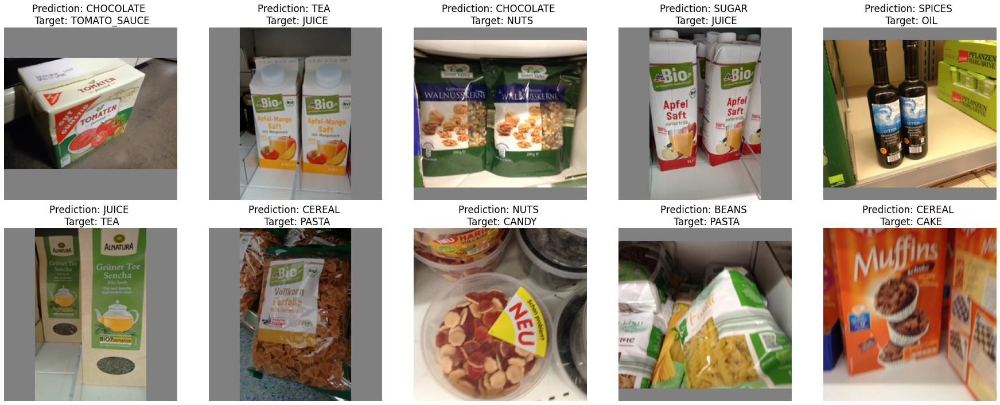

[1.4510697222719289, 0.5737373677167026]

In [161]:
prefix='resnet18'
model = models.resnet18(pretrained=True)
n_inputs = model.fc.in_features
model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.LogSoftmax(dim=1))

if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

model.load_state_dict(torch.load('best_model_%s.pt'%prefix))
validate_saved_model(model=model,prefix=prefix)

## 3 Resnet50+mse


I made this change by changing Logsoftmax to softmax and changing target to one-hot encoded.

When using MSE, the loss becomes very small ( down to 0.2 in 10 epoch) and accuracy becomes smaller(58.0%). This is because the formula of MSE for calculating loss is different. Cross entropy would have much more loss value when the prediction and target is different than MSE. From this modification I can see that loss function may have imapact on model performance, it's important to choose the right loss function for specifc problem.

The training time shrinks too. Average time per epoch when using MSE is 38s, while RESnet with NLLloss is around 60s per epoch.

<All keys matched successfully>

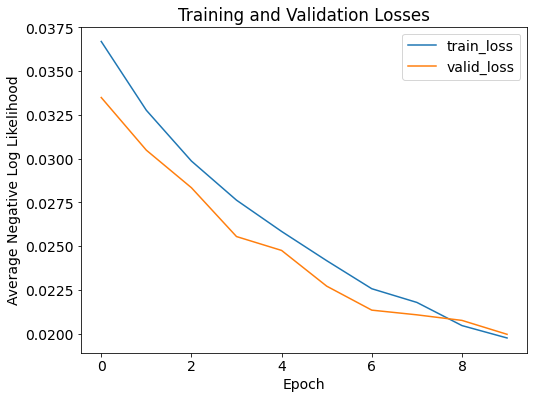

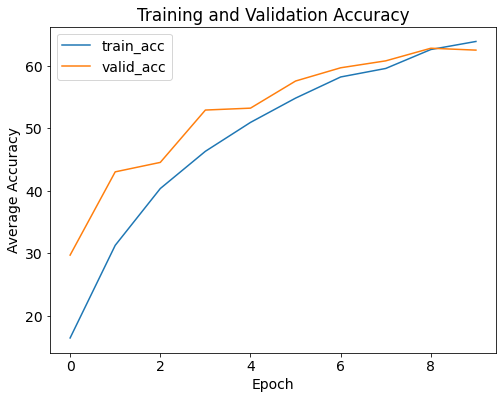

overall loss: 0.022260208958477686
overall accuracy: 0.5808080821326285
report: 

              precision    recall  f1-score   support

       BEANS       0.45      0.78      0.57        27
        CAKE       0.57      0.72      0.64        32
       CANDY       0.65      0.60      0.63        75
      CEREAL       0.52      0.59      0.55        56
       CHIPS       0.53      0.56      0.54        36
   CHOCOLATE       0.45      0.63      0.53        62
      COFFEE       0.78      0.65      0.71        60
        CORN       0.55      0.58      0.56        19
        FISH       0.53      0.41      0.46        22
       FLOUR       0.44      0.18      0.26        22
       HONEY       0.71      0.46      0.56        37
         JAM       0.69      0.79      0.74        48
       JUICE       0.62      0.64      0.63        61
        MILK       0.49      0.53      0.51        32
        NUTS       0.50      0.38      0.43        34
         OIL       0.62      0.69      0.66        29

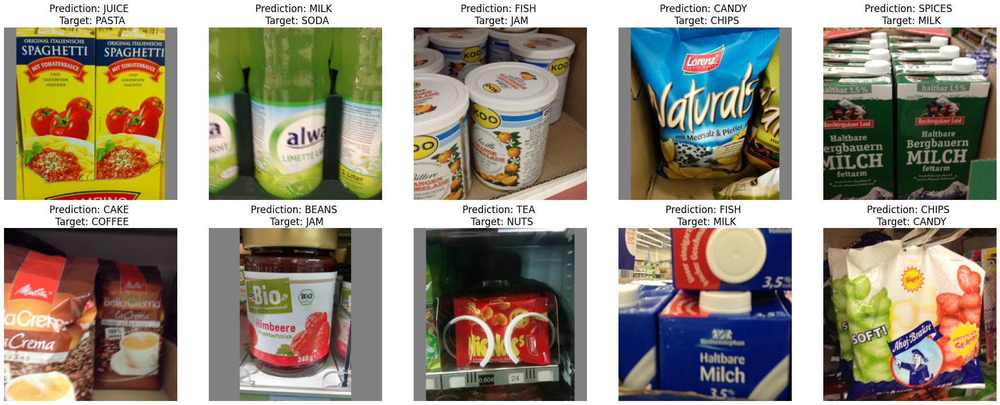

()

In [29]:
prefix='resnet50_mse'
model = models.resnet50(pretrained=True)
n_inputs = model.fc.in_features
model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.Softmax(dim=1))

if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

model.load_state_dict(torch.load('best_model_%s.pt'%prefix))
validate_saved_model(model=model,prefix=prefix)

## 4 Ensemble method

I tried a bunch of models and pick the best 3 models to do ensemble. The accuracy of any of them doesn't exceed 82%, however, when ensemlie together, the overall acuuracy is 88%. 


Training detail:

’Densenet161‘(30epoch)   accuracy: 78%  

'resnext101_32x8d_wsl'(30epoch) accuracy: 82% 

'resnext101_32x16d_wsl'(30epoch) accuracy: 82% 

In [10]:
prefix='resnext101_32x16d_wsl'

model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x16d_wsl')

n_inputs = model.fc.in_features
model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.LogSoftmax(dim=1))


if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}


criterion = nn.NLLLoss()

model.load_state_dict(torch.load('model/best_model_%s.pt'%prefix))
model1=model

Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_master


<All keys matched successfully>

In [11]:
prefix='resnext101_32x8d_wsl'

model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x8d_wsl')

n_inputs = model.fc.in_features
model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.LogSoftmax(dim=1))


if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}


criterion = nn.NLLLoss()


model.load_state_dict(torch.load('model/best_model_%s.pt'%prefix))
model2=model

Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_master


<All keys matched successfully>

In [12]:
prefix='dense161'

model = torch.hub.load('pytorch/vision:v0.6.0', 'densenet161', pretrained=True)

n_inputs = model.classifier.in_features
model.classifier = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),
                      nn.LogSoftmax(dim=1))

if train_on_gpu:
    model = model.to('cuda')

model.class_to_idx = data['train'].class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

criterion = nn.NLLLoss()

model.load_state_dict(torch.load('model/best_model_%s.pt'%prefix))
model3=model

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.6.0


<All keys matched successfully>

overall loss: 0.7040366639994612
overall accuracy: 0.8818181859122383
report: 

              precision    recall  f1-score   support

       BEANS       0.96      0.96      0.96        27
        CAKE       0.88      0.91      0.89        32
       CANDY       0.85      0.95      0.89        75
      CEREAL       0.91      0.75      0.82        56
       CHIPS       0.85      0.92      0.88        36
   CHOCOLATE       0.78      0.84      0.81        62
      COFFEE       0.89      0.93      0.91        60
        CORN       0.95      1.00      0.97        19
        FISH       1.00      0.86      0.93        22
       FLOUR       0.90      0.86      0.88        22
       HONEY       0.89      0.89      0.89        37
         JAM       0.96      0.94      0.95        48
       JUICE       0.86      0.97      0.91        61
        MILK       0.83      0.91      0.87        32
        NUTS       0.94      0.85      0.89        34
         OIL       0.81      0.86      0.83        29
 

<Figure size 1800x720 with 0 Axes>

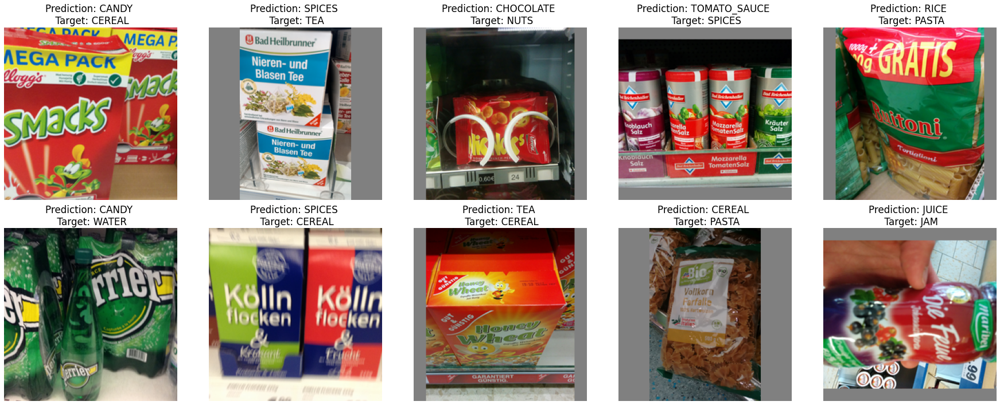

In [174]:
#validate
valid_loader = dataloaders_noshuffle['val']
valid_loss = 0.0
valid_acc = 0.0
pred_array=np.array([])
target_array=np.array([])
with torch.no_grad():
  # Set to evaluation mode
  # model.eval()

  # Validation loop
  i=0
  for input_data, target in valid_loader:
    
      # Tensors to gpu
      if train_on_gpu:
          input_data, target = input_data.cuda(), target.cuda()

      # Forward pass
      output1 = model1(input_data)
      output2 = model2(input_data)
      output3 = model3(input_data)
 
      output = (output1+output2+output3)/3


      loss = criterion(output, target)
      valid_loss += loss.item() * input_data.size(0)

      # Calculate validation accuracy
      _, pred = torch.max(output, dim=1)
      
      
      correct_tensor = pred.eq(target.data.view_as(pred))

      accuracy = torch.mean(
          correct_tensor.type(torch.FloatTensor))
      # Multiply average accuracy times the number of examples
      valid_acc += accuracy.item() * input_data.size(0)
      #save result
      pred=pred.cpu().numpy()
      target=target.cpu().numpy()
      pred_array=np.concatenate((pred_array,pred))
      target_array=np.concatenate((target_array,target))

valid_loss = valid_loss / len(valid_loader.dataset)
valid_acc = valid_acc / len(valid_loader.dataset)
print('overall loss:',valid_loss)
print('overall accuracy:',valid_acc)
print('report: \n')
from sklearn.metrics import classification_report
y_true = target_array
y_pred = pred_array
target_names = list(data['train'].class_to_idx.keys())
print(classification_report(y_true, y_pred, target_names=target_names))
#missclassified data
mis_img=input_data[correct_tensor==False][:10].cpu()
correct_tensor=correct_tensor.cpu()
mis_pred=pred[correct_tensor==False][:10]
mis_target=target[correct_tensor==False][:10]
print('10 misclassified images:\n')
plt.figure(figsize=(25, 10))
for i in range(10):
    ax = plt.subplot(2, 5, i + 1)
    _ = imshow_tensor(mis_img[i], ax=ax)
    ax.title.set_text('Prediction: %s \n Target: %s'%(target_names[mis_pred[i]],target_names[mis_target[i]]))

plt.tight_layout()
plt.show()